# AI Photo Editing with InPainting project

In this project we will build a nice web app that allows you to swap out the background of a subject and substitute it with an image generated by Stable Diffusion through a text prompt:

Let's start by importing what we need:

In [2]:
from PIL import Image
import requests
from transformers import SamModel, SamProcessor
from diffusers import DiffusionPipeline, AutoPipelineForText2Image, AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

import torch
import numpy as np

## SAM

SAM stands for Segment Anything Model. This model was open sourced by Meta.
We'll use the SAM model in this project.

In [3]:
# Load the SAM model as we have seen in the class
model = SamModel.from_pretrained("facebook/sam-vit-base").to('cuda')

# Load the SamProcessor using the facebook/sam-vit-base checkpoint
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/375M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

### Get the mask

Now that we have loaded SAM, we complete the following function that uses SAM to produce a segmentation mask:

In [4]:
def mask_to_rgb(mask):
    """
    Transforms a binary mask into an RGBA image for visualization
    """
    
    bg_transparent = np.zeros(mask.shape + (4, ), dtype=np.uint8)
    
    # Color the area we will replace in green
    # (this vector is [Red, Green, Blue, Alpha])
    bg_transparent[mask == 1] = [0, 255, 0, 127]
    
    return bg_transparent


def get_processed_inputs(image, input_points):
    
    # Use the processor to generate the right inputs for SAM
    inputs = processor(image, input_points=input_points, return_tensors="pt").to("cuda")
    
    # Call SAM
    outputs = model(**inputs)
    
    # Post process the outputs of SAM to obtain the masks
    masks = processor.image_processor.post_process_masks(
       outputs.pred_masks.cpu(), 
       inputs["original_sizes"].cpu(), 
       inputs["reshaped_input_sizes"].cpu()
    )
    
    # Here we select the mask with the highest score
    best_mask = masks[0][0][outputs.iou_scores.argmax()] 

    # Invert the mask by using the ~ operator so that the subject 
    # pixels will have a value of 0 and the background pixels a value of 1. 
    # This will make it more convenient to infill the background
    return ~best_mask.cpu().numpy()

Now let's test what we have done so far. By executing this cell we should get a visualization of the mask for the following car:

<img src='car.png' width="200px"></img>

Let's see what happens in this cell:
1. We open the image of the car and **we resize it to 512 by 512 pixels** (a square image). This makes things simpler for this project
2. We define a few points on the image that indicate where the car is
3. We use the function we have defined to generate a mask using SAM
4. We visualize the mask

The mask should look like this:

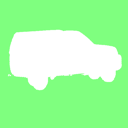

If it doesn't or you get errors, double check the code you have completed above and fix it before moving on.

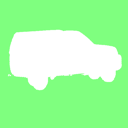

In [5]:
raw_image = Image.open("car.png").convert("RGB").resize((512, 512))

# These are the coordinates of two points on the car
input_points = [[[150, 170], [300, 250]]]

mask = get_processed_inputs(raw_image, input_points)

Image.fromarray(mask_to_rgb(mask)).resize((128, 128))

AWESOME! The images are identical which confirms that we have set up SAM correctly.

## Inpainting

Now that we have completed the SAM setup, let's move to the inpainting setup.

Let's start by loading our inpainting pipeline. We will use the `diffusers/stable-diffusion-xl-1.0-inpainting-0.1` pretrained model and the `AutoPipelineForInpainting` as we have seen in our `diffusers` demo in Lesson 5.

We complete the following code and run it (it might take a few minutes to run):

> **NOTE**: you will probably see a warning similar to ``The config attributes {'decay'...``. Please ignore it. It is a warning generated by the diffusers library that does not constitute a problem for our application

In [6]:
# Load the AutoPipelineForInpainting pipeline 

pipeline = AutoPipelineForInpainting.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16
)

# This will make it more efficient on our hardware
pipeline.enable_model_cpu_offload()

model_index.json:   0%|          | 0.00/690 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.93k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/659 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


Now we complete the following function which gets in input:
1. The raw image
2. The mask generated by SAM (a numpy array)
3. The text prompt for the infill
4. An optional negative prompt
5. An optional seed for repeatibility
6. The Classifier-Free Guidance Scale (CFGS). If you don't remember what this is, refer to the Text Conditioning explanation in Lesson 5

In [8]:
def inpaint(raw_image, input_mask, prompt, negative_prompt=None, seed=74294536, cfgs=5):
    
    mask_image = Image.fromarray(input_mask)
    
    rand_gen = torch.manual_seed(seed)
  
    image = pipeline(
                prompt=prompt, 
                negative_prompt=negative_prompt, 
                image=raw_image, 
                mask_image=mask_image,
                generator=rand_gen,
                guidance_scale=cfgs).images[0]

    return image

Let's test our inpainting on the mask we have obtained earlier with SAM:

In [9]:
prompt = "a car driving on Mars. Studio lights, 1970s"
negative_prompt = "artifacts, low quality, distortion"

image = inpaint(raw_image, mask, prompt, negative_prompt)

  0%|          | 0/49 [00:00<?, ?it/s]

Let's have a look at what we have produced:

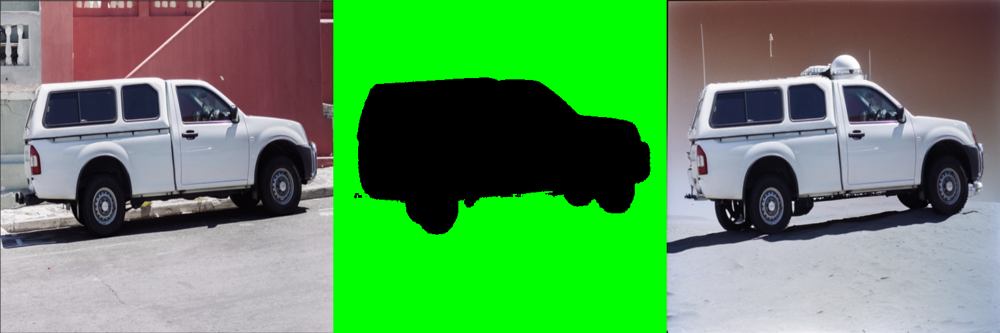

In [10]:
fig = make_image_grid([raw_image, Image.fromarray(mask_to_rgb(mask)), image.resize((512, 512))], rows=1, cols=3)
fig

Cool! We now have our car on planet mars. It even includes some shadow which is pretty cool.

## Interactive app

To make things a bit more fun, we have prepared an interactive app for you that uses the code you have completed and allow you to upload an image, run SAM, and generate the new background through a text prompt.

Simply execute the following cell. The output will contain a preview of the app: **DO NOT USE IT**. Instead, you will also see a link similar to this:

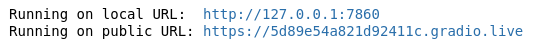

Click on the second link (the public URL), from there you will be able to use the app much more comfortably.

> NOTE: if for any reason you need to stop the app, click on the stop icon of the jupyter interface:   then **execute the next cell containing the code `my_app.close`**


In [11]:
import app

In [12]:
my_app = app.generate_app(get_processed_inputs, inpaint)

Running on local URL:  http://127.0.0.1:7860
Running on public URL: https://9edc831ebf3c8872d5.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://9edc831ebf3c8872d5.gradio.live


### Examples
In this section we run multiple examples to test our application and model

### Example 1: A runner in the African savanna
We use the photo of a runner on the shoreline and ask the model to swap the background with wildflife animals running in the the Africa savanna.

* **Prompt:** "Wildlife animals running in Africa savanna dirt path High resolution 8K realistic National Geographic"
* **Negative Prompt:** "water, small giraffe, artifacts, low quality, distortion"
Random seed: 74294536

#### Results
Here are the results generated by our model:

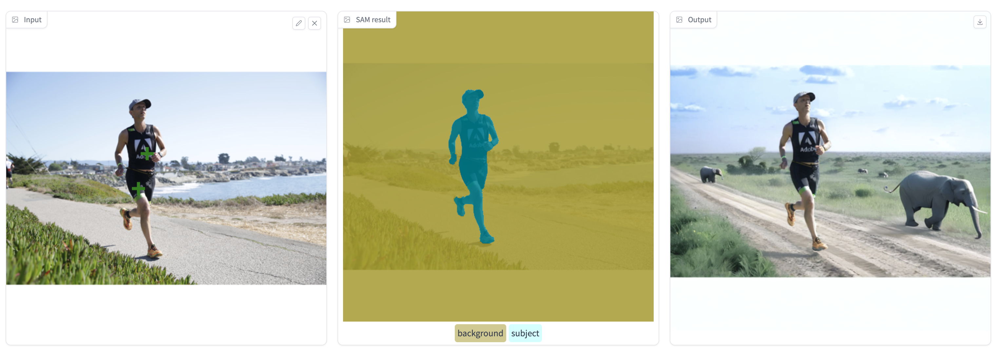

### Example 2: A runner in the African savanna with higher Classifier-Free Guidance Scale (cfgs)
We increase the **CFGS parameter** to **16**. This reduces the creativity and forces the model to stick to the prompt as much as possible.
* **Prompt:** "Wildlife animals running in Africa savanna dirt path High resolution 8K realistic National Geographic"
* **Negative Prompt:** "water, small giraffe, artifacts, low quality, **over exposure**, distortion"
Random seed: 74294536

We also added over-exposure to the negative prompt because the initial image was a bit too dark

#### Results
Here are the results generated by our model:

We notice that we now have more elephants. The photo displays more details. 

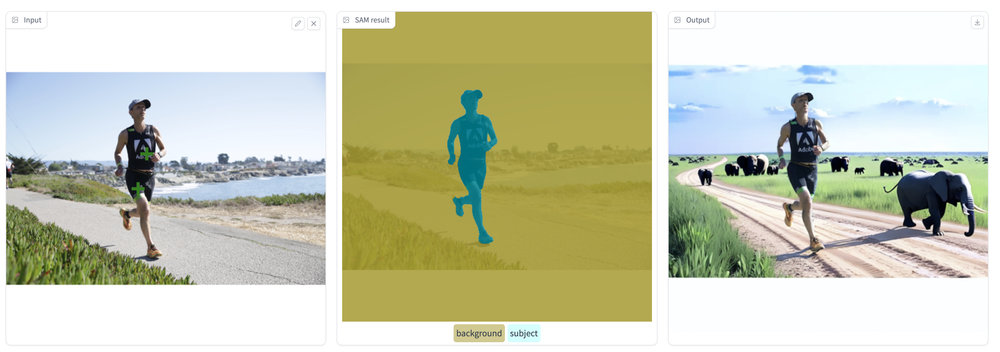

### Example 3: A monkey running in Santa Cruz
Let's now replace the runner with a gorilla generated by the model. 
We use the *"infill subject instead of backfground"* command.
* **Prompt:** "Gorilla running"
* **Negative Prompt:** "artifacts, low quality, distortion"

Random seed: 74294536. We also set cfgs back to **14** to provide more creativity.
#### Results
Here are the results generated by our model:

We can now see a gorilla running.

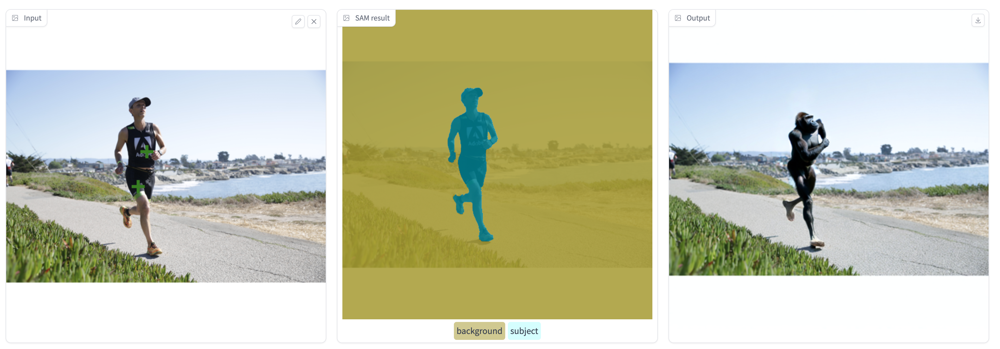

### Example 4: A super hero monkey running in Santa Cruz with Pixar movie style
We replace the runner this time with a super hero monkey generated by the model and ask to use the Pixar style.
* **Prompt:** "A super hero monkey running with red shoes High resolution 8K Pixar style"
* **Negative Prompt:** "artifacts, low quality, distortion"

cfgs is set to 16

#### Results
Here are the results generated by our model:

The original runner has been replaced by a super hero monkey. The character is painted in Pixar style.

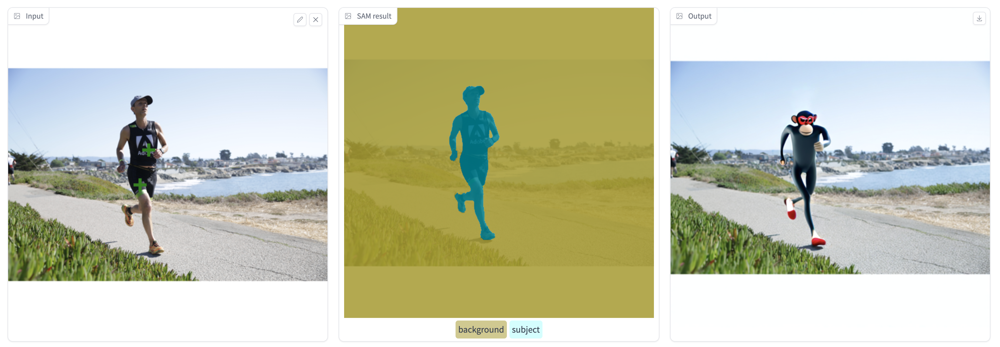

### Example 5: A super hero monkey running in a Pixar like decor
We reuse the image generated in the previous example and ask the model to generate a Pixar like background. That way, we generate a super hero monkey running in a cartoonish Santa Cruz like decor. 
* **Prompt:** "Apply Pixar style to mask"
* **Negative Prompt:** "characters, low quality, distortion"

cfgs is set to 16

#### Results
Here are the results generated by our model:

We can observe similarities between the orginal runner photo and the final image.

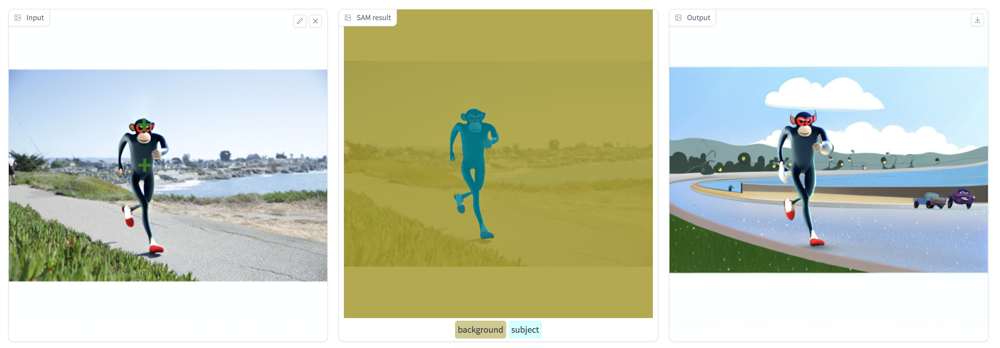

In [13]:
my_app.close()

Closing server running on port: 7860


## Conclusion
In this project, we managed to create a Generative AI pipeline which enables users to apply transformations to a subject or background. We leverage the powerful SAM model (thank you Meta for making it open source!). We also leverage the **stable-diffusion-xl-1.0-inpainting-0.1** diffusion model.
Overall, it was a fun project and it shows the incredible possibilities offered by the diffusion models.